In [8]:
!pip install music21

In [9]:
!pip install midi2audio

In [10]:
!pip install fluidsynth

In [11]:
!apt install fluidsynth

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fluidsynth is already the newest version (1.1.9-1).
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [12]:
# ต้องใช้ sound font ด้วย ลองหา .sf2 ก่อน
!find / -name *.sf2

/content/font.sf2


In [13]:
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2

In [14]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [15]:
cd './drive/My Drive/Automated Music Generation'

/content/drive/My Drive/Automated Music Generation


In [16]:
!unzip 'schubert.zip' -d './../../../Midi_files'

Archive:  schubert.zip
replace ./../../../Midi_files/schubert_D850_1.mid? [y]es, [n]o, [A]ll, [N]one, [r]ename: ya
  inflating: ./../../../Midi_files/schubert_D850_1.mid  
replace ./../../../Midi_files/schubert_D850_2.mid? [y]es, [n]o, [A]ll, [N]one, [r]ename: a
error:  invalid response [a]
replace ./../../../Midi_files/schubert_D850_2.mid? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: ./../../../Midi_files/schubert_D850_2.mid  
  inflating: ./../../../Midi_files/schubert_D850_3.mid  
  inflating: ./../../../Midi_files/schubert_D850_4.mid  
  inflating: ./../../../Midi_files/schubert_D935_1.mid  
  inflating: ./../../../Midi_files/schubert_D935_2.mid  
  inflating: ./../../../Midi_files/schubert_D935_3.mid  
  inflating: ./../../../Midi_files/schubert_D935_4.mid  
  inflating: ./../../../Midi_files/schub_d760_1.mid  
  inflating: ./../../../Midi_files/schub_d760_2.mid  
  inflating: ./../../../Midi_files/schub_d760_3.mid  
  inflating: ./../../../Midi_files/schub_d760_4.mid  
  

In [17]:
cd './../../../'

/content


In [18]:
from midi2audio import FluidSynth

In [19]:
from music21 import *
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import keras

Using TensorFlow backend.


In [20]:
#defining function to read MIDI files
def read_midi(file):
    
    print("Loading Music File:",file)
    
    notes=[]
    notes_to_parse = None
    
    #parsing a midi file
    midi = converter.parse(file)
  
    #grouping based on different instruments
    s2 = instrument.partitionByInstrument(midi)

    #Looping over all the instruments
    for part in s2.parts:
    
        #select elements of only piano
        if 'Piano' in str(part): 
        
            notes_to_parse = part.recurse() 
      
            #finding whether a particular element is note or a chord
            for element in notes_to_parse:
                
                #note
                if isinstance(element, note.Note):
                    notes.append(str(element.pitch))
                
                #chord
                elif isinstance(element, chord.Chord):
                    notes.append('.'.join(str(n) for n in element.normalOrder))

    return np.array(notes)

In [21]:
#for listing down the file names
import os

#Array Processing
import numpy as np

#specify the path
path='./Midi_files/'

#read all the filenames
files=[i for i in os.listdir(path) if i.endswith(".mid")]

#reading each midi file
notes_array = np.array([read_midi(path+i) for i in files])

Loading Music File: ./Midi_files/schumm-6.mid
Loading Music File: ./Midi_files/schubert_D935_2.mid
Loading Music File: ./Midi_files/schumm-3.mid
Loading Music File: ./Midi_files/schubert_D935_3.mid
Loading Music File: ./Midi_files/schubert_D850_3.mid
Loading Music File: ./Midi_files/schub_d760_2.mid
Loading Music File: ./Midi_files/schubert_D850_2.mid
Loading Music File: ./Midi_files/schubert_D850_1.mid
Loading Music File: ./Midi_files/schubert_D850_4.mid
Loading Music File: ./Midi_files/schu_143_3.mid
Loading Music File: ./Midi_files/schumm-5.mid
Loading Music File: ./Midi_files/schub_d760_4.mid
Loading Music File: ./Midi_files/schub_d960_4.mid
Loading Music File: ./Midi_files/schubert_D935_4.mid
Loading Music File: ./Midi_files/schub_d960_3.mid
Loading Music File: ./Midi_files/schuim-3.mid
Loading Music File: ./Midi_files/schub_d960_1.mid
Loading Music File: ./Midi_files/schumm-4.mid
Loading Music File: ./Midi_files/schuim-4.mid
Loading Music File: ./Midi_files/schu_143_1.mid
Loading

In [22]:
#converting 2D array into 1D array
notes_ = [element for note_ in notes_array for element in note_]

#No. of unique notes
unique_notes = list(set(notes_))
print(len(unique_notes))

304


(array([187.,  41.,  26.,  11.,   6.,   9.,  12.,   6.,   3.,   3.]),
 array([1.0000e+00, 1.4790e+02, 2.9480e+02, 4.4170e+02, 5.8860e+02,
        7.3550e+02, 8.8240e+02, 1.0293e+03, 1.1762e+03, 1.3231e+03,
        1.4700e+03]),
 <a list of 10 Patch objects>)

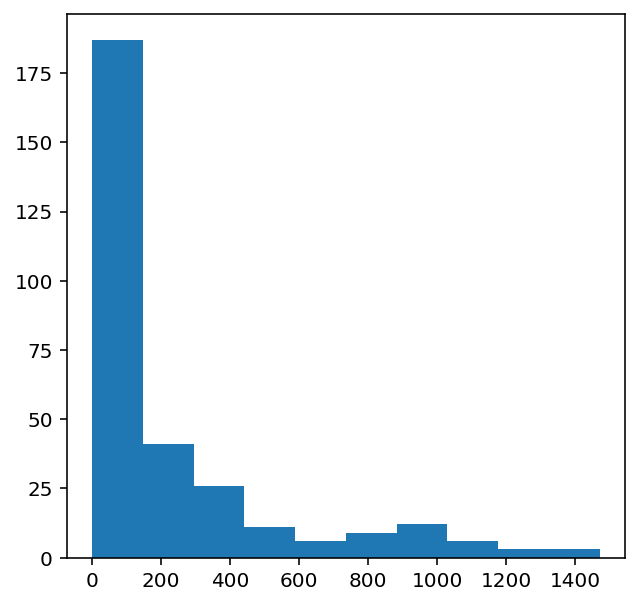

In [23]:
#importing library
from collections import Counter

#computing frequency of each note
freq = dict(Counter(notes_))

#library for visualiation
import matplotlib.pyplot as plt

#consider only the frequencies
no=[count for _,count in freq.items()]

#set the figure size
plt.figure(figsize=(5,5))

#plot
plt.hist(no)

In [24]:
frequent_notes = [notes for notes, count in freq.items() if count>=40]
print(len(frequent_notes))

177


In [25]:
new_music =[]

for notes in notes_array:
  temp = []
  for note in notes:
    if note in frequent_notes:
      temp.append(note)
  new_music.append(temp)

new_music = np.array(new_music)

In [26]:
time_steps = 100
x = []
y = []

for notes in new_music:
  for i in range(0, len(notes)-time_steps):
    input = notes[i:i+time_steps]
    output = notes[i:i+time_steps+1]
    x.append(input)
    y.append(output)

x = np.array(x)
y = np.array(y)

In [27]:
unique_x = list(set(x.ravel()))
x_note_to_int = dict((note, num) for num, note in enumerate(unique_x))

In [28]:
x_seq = []
for i in x:
  temp = []
  for n in i:
    temp.append(x_note_to_int[n])
  x_seq.append(temp)

x_seq = np.array(x_seq)

In [29]:
unique_y = list(set(y.ravel()))
y_note_to_int = dict((note_, number) for number, note_ in enumerate(unique_y)) 
y_seq = []
for i in y:
  temp = []
  for n in i:
    temp.append(y_note_to_int[n])
  y_seq.append(temp)

y_seq = np.array(y_seq)

In [30]:
from sklearn.model_selection import train_test_split as tts
x_train, x_val, y_train, y_val = tts(x_seq, y_seq, test_size = 0.1, random_state=0)

In [31]:
x_vocab = len(unique_x)
y_vocab = len(unique_y)

BUFFER_SIZE = len(x_train)
BATCH_SIZE = 64
steps_per_epoch = len(x_train)//BATCH_SIZE
embedding_dim = 256
units = 1024

In [32]:
x_train_tensor = tf.convert_to_tensor(x_train)
y_train_tensor = tf.convert_to_tensor(y_train)
x_val_tensor = tf.convert_to_tensor(x_val)
y_val_tensor = tf.convert_to_tensor(y_val)

dataset = tf.data.Dataset.from_tensor_slices((x_train_tensor, y_train_tensor)).shuffle(BUFFER_SIZE)
dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
validation_data = tf.data.Dataset.from_tensor_slices((x_val_tensor, y_val_tensor)).batch(BATCH_SIZE, drop_remainder=True)

In [33]:
example_input_batch, example_target_batch = next(iter(dataset))
example_input_batch.shape, example_target_batch.shape

(TensorShape([64, 100]), TensorShape([64, 101]))

In [34]:
def get_angles(pos, i, d_model):
  angle_rates = 1 / np.power(10000, (2 * (i//2)) / np.float32(d_model))
  return pos * angle_rates

In [35]:
def positional_encoding(pos, d_model):
  angles_rad = get_angles(np.arange(pos)[:,np.newaxis],np.arange(d_model)[np.newaxis, :], d_model)

  angles_rad[:,0::2] = np.sin(angles_rad[:,0::2])

  angles_rad[:,1::2] = np.cos(angles_rad[:,1::2])

  pos_encoding = angles_rad[np.newaxis, ...]
  return tf.cast(pos_encoding, dtype=tf.float32)

(1, 50, 512)


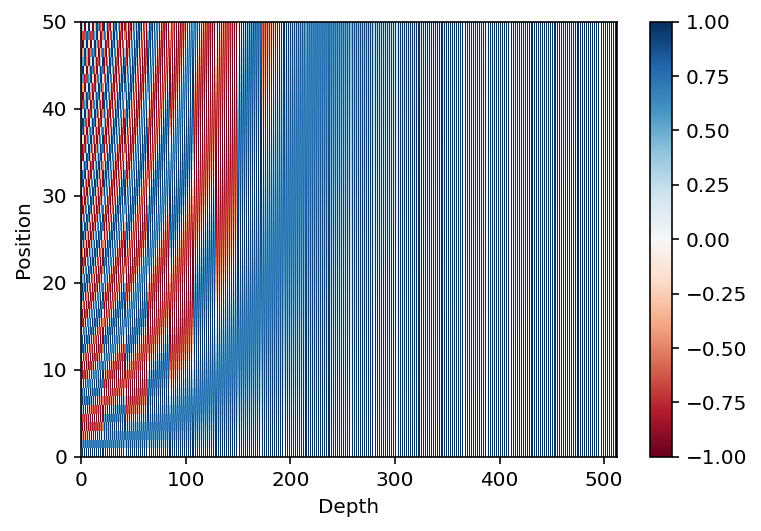

In [36]:
pos_encoding = positional_encoding(50, 512)
print (pos_encoding.shape)

plt.pcolormesh(pos_encoding[0], cmap='RdBu')
plt.xlabel('Depth')
plt.xlim((0, 512))
plt.ylabel('Position')
plt.colorbar()
plt.show()

In [37]:
def create_padding_mask(seq):
  seq=tf.cast(tf.math.equal(seq,0), tf.float32)

  return seq[:,tf.newaxis, tf.newaxis,:]

In [38]:
def lookahead_mask(size):
  mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
  return mask

In [39]:
def scaled_dot_product(q,k,v, mask):
  x = tf.matmul(q,k, transpose_b=True)

  dk = tf.math.sqrt(tf.cast(tf.shape(k)[1], tf.float32))
  scaled_attention_weights = x/dk

  if mask!=None:
    scaled_attention_weights *= mask*-1e9

  attention_weights = tf.nn.softmax(scaled_attention_weights, axis=-1)

  output = tf.matmul(attention_weights, v)

  return output, attention_weights 


In [40]:
def print_out(q, k, v):
  temp_out, temp_attn = scaled_dot_product(
      q, k, v, None)
  print ('Attention weights are:')
  print (temp_attn)
  print ('Output is:')
  print (temp_out)
np.set_printoptions(suppress=True)

temp_k = tf.constant([[10,0,0],
                      [0,10,0],
                      [0,0,10],
                      [0,0,10]], dtype=tf.float32)  # (4, 3)

temp_v = tf.constant([[   1,0],
                      [  10,0],
                      [ 100,5],
                      [1000,6]], dtype=tf.float32)  # (4, 2)

# This `query` aligns with the second `key`,
# so the second `value` is returned.
temp_q = tf.constant([[0, 0, 10]], dtype=tf.float32)  # (1, 3)
print_out(temp_q, temp_k, temp_v)

Attention weights are:
tf.Tensor([[0.  0.  0.5 0.5]], shape=(1, 4), dtype=float32)
Output is:
tf.Tensor([[550.    5.5]], shape=(1, 2), dtype=float32)


In [41]:
class MultiheadAttention(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads):
    super(MultiheadAttention, self).__init__()
    self.d_model = d_model
    self.num_heads = num_heads

    assert d_model % self.num_heads == 0
    
    self.depth = d_model // self.num_heads

    self.wq = tf.keras.layers.Dense(d_model)
    self.wk = tf.keras.layers.Dense(d_model)
    self.wv = tf.keras.layers.Dense(d_model)

    self.dense = tf.keras.layers.Dense(d_model)

  def split_heads(self, x, batch_size):
    x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
    return tf.transpose(x, perm=[0,2,1,3])
  
  def call(self, q, v, k, mask):
    batch_size = tf.shape(k)[0]

    q = self.wq(q)
    k = self.wq(k)
    v = self.wq(v)

    q = self.split_heads(q, batch_size)
    v = self.split_heads(v, batch_size)
    k = self.split_heads(k, batch_size)

    output, attention_weights = scaled_dot_product(q,k,v, mask)

    output = tf.transpose(output, perm =[0,2,1,3])

    output = tf.reshape(output, (batch_size, -1, self.d_model))

    return output, attention_weights

In [42]:
def point_wise_feed_forward_network(d_model, dff):
  return tf.keras.Sequential([
      tf.keras.layers.Dense(dff, activation='relu'),  # (batch_size, seq_len, dff)
      tf.keras.layers.Dense(d_model)  # (batch_size, seq_len, d_model)
  ])

In [43]:
class EncoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(EncoderLayer, self).__init__()

    self.mha = MultiheadAttention(d_model, num_heads)
    self.ffn = point_wise_feed_forward_network(d_model, dff)

    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    
    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)
    
  def call(self, x, training, mask):

    attn_output, _ = self.mha(x, x, x, mask)  
    attn_output = self.dropout1(attn_output, training=training)
    out1 = self.layernorm1(x + attn_output)  
    
    ffn_output = self.ffn(out1)  
    ffn_output = self.dropout2(ffn_output, training=training)
    out2 = self.layernorm2(out1 + ffn_output) 
    
    return out2

In [44]:
class DecoderLayer(tf.keras.layers.Layer):
  def __init__(self, d_model, num_heads, dff, rate=0.1):
    super(DecoderLayer, self).__init__()

    self.mha1 = MultiheadAttention(d_model, num_heads)
    self.mha2 = MultiheadAttention(d_model, num_heads)

    self.ffn = point_wise_feed_forward_network(d_model, dff)
 
    self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    self.layernorm3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
    
    self.dropout1 = tf.keras.layers.Dropout(rate)
    self.dropout2 = tf.keras.layers.Dropout(rate)
    self.dropout3 = tf.keras.layers.Dropout(rate)
    
    
  def call(self, x, enc_output, training, look_ahead_mask, padding_mask):

    attn1, attn_weights_block1 = self.mha1(x, x, x, look_ahead_mask) 
    attn1 = self.dropout1(attn1, training=training)
    out1 = self.layernorm1(attn1 + x)
    
    attn2, attn_weights_block2 = self.mha2(
        enc_output, enc_output, out1, padding_mask) 
    attn2 = self.dropout2(attn2, training=training)
    out2 = self.layernorm2(attn2 + out1)  
    
    ffn_output = self.ffn(out2) 
    ffn_output = self.dropout3(ffn_output, training=training)
    out3 = self.layernorm3(ffn_output + out2)
    
    return out3, attn_weights_block1, attn_weights_block2

In [45]:
class Encoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff, input_vocab_size,
               maximum_position_encoding, rate=0.1):
    super(Encoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers
    
    self.embedding = tf.keras.layers.Embedding(input_vocab_size, d_model)
    self.pos_encoding = positional_encoding(maximum_position_encoding, 
                                            self.d_model)
    
    
    self.enc_layers = [EncoderLayer(d_model, num_heads, dff, rate) 
                       for _ in range(num_layers)]
  
    self.dropout = tf.keras.layers.Dropout(rate)
        
  def call(self, x, training, mask):

    seq_len = tf.shape(x)[1]
    
    x = self.embedding(x) 
    x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
    x += self.pos_encoding[:, :seq_len, :]

    x = self.dropout(x, training=training)

    for i in range(self.num_layers):
      x = self.enc_layers[i](x, training, mask)
    return x 

In [46]:
class Decoder(tf.keras.layers.Layer):
  def __init__(self, num_layers, d_model, num_heads, dff, target_vocab_size,
               maximum_position_encoding, rate=0.1):
    super(Decoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers
    
    self.embedding = tf.keras.layers.Embedding(target_vocab_size, d_model)
    self.pos_encoding = positional_encoding(maximum_position_encoding, d_model)
    
    self.dec_layers = [DecoderLayer(d_model, num_heads, dff, rate) 
                       for _ in range(num_layers)]
    self.dropout = tf.keras.layers.Dropout(rate)
    
  def call(self, x, enc_output, training, 
           look_ahead_mask, padding_mask):

    seq_len = tf.shape(x)[1]
    attention_weights = {}
    
    x = self.embedding(x) 
    x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
    x += self.pos_encoding[:, :seq_len, :]
    
    x = self.dropout(x, training=training)
    for i in range(self.num_layers):
      x, block1, block2 = self.dec_layers[i](x, enc_output, training,
                                             look_ahead_mask, padding_mask)
      
      attention_weights['decoder_layer{}_block1'.format(i+1)] = block1
      attention_weights['decoder_layer{}_block2'.format(i+1)] = block2
    return x, attention_weights

In [47]:
class Transformer(tf.keras.Model):
  def __init__(self, num_layers, d_model, num_heads, dff, input_vocab_size, 
               target_vocab_size, pe_input, pe_target, rate=0.1):
    super(Transformer, self).__init__()

    self.encoder = Encoder(num_layers, d_model, num_heads, dff, 
                           input_vocab_size, pe_input, rate)

    self.decoder = Decoder(num_layers, d_model, num_heads, dff, 
                           target_vocab_size, pe_target, rate)

    self.final_layer = tf.keras.layers.Dense(target_vocab_size)
    
  def call(self, inp, tar, training, enc_padding_mask, 
           look_ahead_mask, dec_padding_mask):

    enc_output = self.encoder(inp, training, enc_padding_mask)
    dec_output, attention_weights = self.decoder(
        tar, enc_output, training, look_ahead_mask, dec_padding_mask)

    final_output = self.final_layer(dec_output) 
    
    return final_output, attention_weights

In [48]:
num_layers = 2
d_model = 128
dff = 512
num_heads = 8
dropout_rate = 0.1

In [49]:
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
  def __init__(self, d_model, warmup_steps=4000):
    super(CustomSchedule, self).__init__()
    
    self.d_model = d_model
    self.d_model = tf.cast(self.d_model, tf.float32)

    self.warmup_steps = warmup_steps
    
  def __call__(self, step):
    arg1 = tf.math.rsqrt(step)
    arg2 = step * (self.warmup_steps ** -1.3)
    
    return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)

In [50]:
learning_rate = CustomSchedule(d_model)

optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98, 
                                     epsilon=1e-9)
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')
train_loss = tf.keras.metrics.Mean(name='train_loss')
val_loss = tf.keras.metrics.Mean(name='validation_loss')

In [51]:
transformer = Transformer(num_layers, d_model, num_heads, dff,
                          x_vocab, y_vocab, 
                          pe_input=x_vocab, 
                          pe_target=y_vocab,
                          rate=dropout_rate)

Text(0.5, 0, 'Train Step')

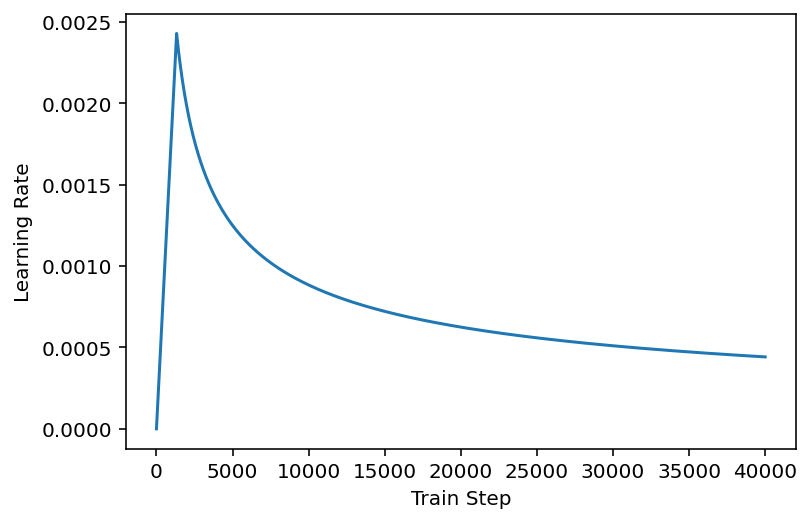

In [52]:
temp_learning_rate_schedule = CustomSchedule(d_model)

plt.plot(temp_learning_rate_schedule(tf.range(40000, dtype=tf.float32)))
plt.ylabel("Learning Rate")
plt.xlabel("Train Step")

In [53]:
checkpoint_dir = './training_checkpoints'
checkpoint = tf.train.Checkpoint(optimizer=optimizer,
                                 transformer = transformer)
ckpt_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=5)


In [54]:
train_step_signature = [
    tf.TensorSpec(shape=(None, None), dtype=tf.int64),
    tf.TensorSpec(shape=(None, None), dtype=tf.int64),
]

@tf.function(input_signature=train_step_signature)
def train_step(inp, targ):
  loss = 0
  tar_inp = targ[:,:-1]
  tar_real = targ[:,1:]

  look_ahead_mask = lookahead_mask(tf.shape(tar_inp)[1])
  enc_padding_mask = None
  dec_padding_mask = None
  with tf.GradientTape() as tape:
    predictions, _ = transformer(inp, tar_inp, 
                                 True, 
                                 enc_padding_mask, 
                                 look_ahead_mask, 
                                 dec_padding_mask)
    loss = loss_object(tar_real, predictions)

  gradients = tape.gradient(loss, transformer.trainable_variables)    
  optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))
  
  train_loss(loss)

In [55]:
val_step_signature = [
    tf.TensorSpec(shape=(None, None), dtype=tf.int64),
    tf.TensorSpec(shape=(None, None), dtype=tf.int64),
]
@tf.function(input_signature=val_step_signature)
def validation_step(inp, targ):
  loss = 0
  tar_inp = targ[:,:-1]
  tar_real = targ[:,1:]

  look_ahead_mask = lookahead_mask(tf.shape(tar_inp)[1])
  enc_padding_mask = None
  dec_padding_mask = None
  
  prob, _ = transformer(inp, tar_inp, 
                              False, 
                              enc_padding_mask, 
                              look_ahead_mask, 
                              dec_padding_mask)
  loss = loss_object(tar_real, prob)
  val_loss(loss)

In [56]:
EPOCHS = 20
Best_loss = 1000000

for epoch in range(EPOCHS):
  train_loss.reset_states()
  val_loss.reset_states()

  for (batch, (inp, targ)) in enumerate(dataset.take(steps_per_epoch)):
    train_step(inp, targ)

    if batch % 100 == 0:
      print('Epoch {} Batch {} Loss {:.4f}'.format(epoch + 1,
                                                   batch,
                                                   train_loss.result()))
  
  for (inp, targ) in validation_data:
    validation_step(inp, targ)
  
  
  print('Epoch: {}, Train_Loss: {:.4f},  Validation_loss: {:.4f}'.format(epoch + 1,
                                      train_loss.result(), val_loss.result()))
  
  
  if val_loss.result()<Best_loss or (epoch+1)%4==0:
    Best_loss = val_loss.result()
    print("Saving Model Checkpoint....................")
    ckpt_manager.save()

Epoch 1 Batch 0 Loss 5.6411
Epoch 1 Batch 100 Loss 5.0625
Epoch 1 Batch 200 Loss 4.5739
Epoch 1 Batch 300 Loss 4.1813
Epoch 1 Batch 400 Loss 3.9161
Epoch 1 Batch 500 Loss 3.7543
Epoch 1 Batch 600 Loss 3.6816
Epoch 1 Batch 700 Loss 3.5981
Epoch 1 Batch 800 Loss 3.5449
Epoch: 1, Train_Loss: 3.4961,  Validation_loss: 2.6775
Saving Model Checkpoint....................
Epoch 2 Batch 0 Loss 2.9539
Epoch 2 Batch 100 Loss 2.8691
Epoch 2 Batch 200 Loss 2.7622
Epoch 2 Batch 300 Loss 2.6499
Epoch 2 Batch 400 Loss 2.7288
Epoch 2 Batch 500 Loss 2.8088
Epoch 2 Batch 600 Loss 2.7755
Epoch 2 Batch 700 Loss 2.7488
Epoch 2 Batch 800 Loss 2.7604
Epoch: 2, Train_Loss: 2.8228,  Validation_loss: 2.7911
Epoch 3 Batch 0 Loss 3.0877
Epoch 3 Batch 100 Loss 2.7635
Epoch 3 Batch 200 Loss 2.9548
Epoch 3 Batch 300 Loss 2.9361
Epoch 3 Batch 400 Loss 3.0034
Epoch 3 Batch 500 Loss 3.0163
Epoch 3 Batch 600 Loss 3.0843
Epoch 3 Batch 700 Loss 3.1218
Epoch 3 Batch 800 Loss 3.1001
Epoch: 3, Train_Loss: 3.0648,  Validation_

In [57]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [58]:
import random
import music21

def generate_music(Notes_len=15, filename='music.mid'):
    ind = np.random.randint(0,len(x_val)-1)

    random_music = x_val[ind]

    random_music = random_music.reshape(1,time_steps)
    input = tf.convert_to_tensor(random_music)

    predictions=list(x_val[ind][-5:])
    for i in range(Notes_len):
      random_music = random_music.reshape(1,time_steps)
      random_target_inp = np.copy(random_music)
      targ_inp = tf.convert_to_tensor(random_target_inp)
      look_ahead_mask = lookahead_mask(tf.shape(targ_inp)[1])
      enc_padding_mask = None
      dec_padding_mask = None

      prob, _ = transformer(input, targ_inp, 
                                False, 
                                enc_padding_mask, 
                                look_ahead_mask, 
                                dec_padding_mask)
      y_pred= tf.argmax(prob[0,-1,:], axis = -1).numpy()
      predictions.append(y_pred)

      random_music = np.insert(random_music[0],len(random_music[0]),y_pred)
      random_music = random_music[1:]
    
    x_int_to_note = dict((number, note_) for number, note_ in enumerate(unique_x)) 
    predicted_notes = [x_int_to_note[i] for i in predictions]

    def convert_to_midi(prediction_output, filename):
   
        offset = 0
        output_notes = []

        # create note and chord objects based on the values generated by the model
        for pattern in prediction_output:
            
            # pattern is a chord
            if ('.' in pattern) or pattern.isdigit():
                notes_in_chord = pattern.split('.')
                notes = []
                for current_note in notes_in_chord:
                    
                    cn=int(current_note)
                    new_note = music21.note.Note(cn)
                    new_note.storedInstrument = instrument.Piano()
                    notes.append(new_note)
                    
                new_chord = chord.Chord(notes)
                new_chord.offset = offset
                output_notes.append(new_chord)
                
            # pattern is a note
            else:
                
                new_note = music21.note.Note(pattern)
                new_note.offset = offset
                new_note.storedInstrument = instrument.Piano()
                output_notes.append(new_note)

            # increase offset each iteration so that notes do not stack
            offset += 1
        midi_stream = stream.Stream(output_notes)
        midi_stream.write('midi', fp=filename)

    convert_to_midi(predicted_notes, filename)
    
    return predicted_notes

In [69]:
for i in range(1, 5):
  _ = generate_music(filename=str('./music_' + str(i) + '_.mid'))

In [70]:
!fluidsynth -ni font.sf2 './music_1_.mid' -F 'output_1.wav' -r 44100
!fluidsynth -ni font.sf2 './music_2_.mid' -F 'output_2.wav' -r 44100
!fluidsynth -ni font.sf2 './music_3_.mid' -F 'output_3.wav' -r 44100
!fluidsynth -ni font.sf2 './music_4_.mid' -F 'output_4.wav' -r 44100

FluidSynth version 1.1.9
Copyright (C) 2000-2018 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of E-mu Systems, Inc.

Rendering audio to file 'output_1.wav'..
FluidSynth version 1.1.9
Copyright (C) 2000-2018 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of E-mu Systems, Inc.

Rendering audio to file 'output_2.wav'..
FluidSynth version 1.1.9
Copyright (C) 2000-2018 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of E-mu Systems, Inc.

Rendering audio to file 'output_3.wav'..
FluidSynth version 1.1.9
Copyright (C) 2000-2018 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of E-mu Systems, Inc.

Rendering audio to file 'output_4.wav'..


In [71]:
from IPython.display import display
from IPython.display import Audio

In [72]:
display(Audio('output_1.wav'))
display(Audio('output_2.wav'))
display(Audio('output_3.wav'))
display(Audio('output_4.wav'))

In [66]:
for i in range(0,20):
  pred = generate_music(Notes_len=20, filename=str('./music_long'+ '_.mid'))
  if len(set(pred))>=7:
    break

In [67]:
!fluidsynth -ni font.sf2 './music_long_.mid' -F 'output_long.wav' -r 44100

FluidSynth version 1.1.9
Copyright (C) 2000-2018 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of E-mu Systems, Inc.

Rendering audio to file 'output_long.wav'..


In [68]:
display(Audio('output_long.wav'))